In [1]:
run_gridsearch = False
skip_best_model_validation = False
skip_best_model_test = False
verbose = True
GPU_SETTING = -1
NUM_ENSEMBLES = 5
BASIN = "guerneville"
RES_1H = "mts_hourly"
RES_1D = "mts_daily"
RUN_LABEL = "BASELINE"
MODE = "mts"
READ_STAMP = "20250815T000000Z"

In [2]:
hyperparam_space = {
    "hidden_size": [64, 128, 256],
    "output_dropout": [0.4],
    "seq_length_1D": [90, 120],
    "seq_length_1H": [168, 336],
    "num_layers": [1],
    "epochs": [16, 32, 48],
    "batch_size": [64, 128],
    "schedule_pairs": [
        ((0.5, 0.25), (0.01, 0.005, 0.001))
    ]
}

In [3]:
import sys
import pandas as pd
import os
import itertools
from pathlib import Path
from tqdm import tqdm
import warnings
from datetime import datetime
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
current_dir = os.getcwd()
print(current_dir)

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville


In [5]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-RR-PROJECT')
sys.path.insert(0, library_path)
print(sys.path)

['../../../../UCB-USACE-RR-PROJECT', '/Library/Frameworks/Python.framework/Versions/3.11/lib/python311.zip', '/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11', '/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/lib-dynload', '', '/Users/maxwellfung/UCB-USACE-RR-PROJECT/venv/lib/python3.11/site-packages']


In [6]:
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import (fractional_multi_lr, write_paths, to_path_or_list, ensure_output_tree, set_active_context, data_dir, repo_root, get_output_dir, make_run_stamp, get_yaml_path, ctx_for, hparams_exists, save_hparams, load_hparams, runs_latest_path, archive_runs_json, read_csv_artifact, ensure_shared_tree, ensure_absolute_basin_files)
from UCB_training.UCB_plotting import (plot_timeseries_comparison, scatter_triptych_pngs_v3, ts_triptych_v3)

In [7]:
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-RR-PROJECT')[0] + 'UCB-USACE-RR-PROJECT'

In [8]:
RUNS_FILE = str(runs_latest_path(BASIN, MODE, RUN_LABEL))
SHOULD_STAMP = not (skip_best_model_validation and skip_best_model_test)
RUN_STAMP = make_run_stamp() if SHOULD_STAMP else None
ACTIVE_STAMP = RUN_STAMP if RUN_STAMP is not None else READ_STAMP

In [9]:
switch_ctx = ctx_for(BASIN, run_stamp=ACTIVE_STAMP, run_label=RUN_LABEL, append_stamp_to_filenames=False)
_SHARED = ensure_shared_tree(BASIN, MODE)
RUNS_PARENT = _SHARED / "runs" / (f"{RUN_LABEL}_{RUN_STAMP}" if RUN_STAMP else RUN_LABEL)

print("NH runs will be written under:")
print(RUNS_PARENT.resolve())

NH runs will be written under:
/Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z


In [10]:
path_to_csv = data_dir()
path_to_yaml = get_yaml_path("synthetic/guerneville_mtslstm2_test")
path_to_physics_data_1D = path_to_csv /  "Guerneville_daily_averaged.csv"
path_to_physics_data_1H = path_to_csv / "Guerneville_hourly.csv"

In [11]:
features_with_physics = [
    "BIG SULPHUR CR ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "DRY CREEK 10 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "GREEN VALLEY ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "LAGUNA ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 30 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 40 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 50 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 60 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 70 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "SANTA ROSA CR 10 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "SANTA ROSA CR 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "WF RUSSIAN ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "BIG SULPHUR CR PRECIP-INC SCREENED",
    "DRY CREEK 10 PRECIP-INC SCREENED",
    "EF RUSSIAN 20 PRECIP-INC SCREENED",
    "GREEN VALLEY PRECIP-INC SCREENED",
    "LAGUNA PRECIP-INC SCREENED",
    "RUSSIAN 20 PRECIP-INC SCREENED",
    "RUSSIAN 30 PRECIP-INC SCREENED",
    "RUSSIAN 40 PRECIP-INC SCREENED",
    "RUSSIAN 50 PRECIP-INC SCREENED",
    "RUSSIAN 60 PRECIP-INC SCREENED",
    "RUSSIAN 70 PRECIP-INC SCREENED",
    "SANTA ROSA CR 10 PRECIP-INC SCREENED",
    "SANTA ROSA CR 20 PRECIP-INC SCREENED",
    "WF RUSSIAN PRECIP-INC SCREENED",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    "SANTA ROSA CA HUMIDITY USAF-NOAA",
    "SANTA ROSA CA SOLAR RADIATION USAF-NOAA",
    "SANTA ROSA CA TEMPERATURE USAF-NOAA",
    "SANTA ROSA CA WINDSPEED USAF-NOAA",
    "UKIAH CA FLOW USGS-MERGED",
    "GEYSERVILLE CA FLOW USGS-MERGED",
    "Guerneville Gage FLOW",
    "Big Sulphur Cr ET-POTENTIAL",
    "Big Sulphur Cr FLOW",
    "Big Sulphur Cr FLOW-BASE",
    "Big Sulphur Cr INFILTRATION",
    "Big Sulphur Cr PERC-SOIL",
    "Big Sulphur Cr SATURATION FRACTION",
    "Dry Creek 10 ET-POTENTIAL",
    "Dry Creek 10 FLOW",
    "Dry Creek 10 FLOW-BASE",
    "Dry Creek 10 INFILTRATION",
    "Dry Creek 10 PERC-SOIL",
    "Dry Creek 10 SATURATION FRACTION",
    "Green Valley ET-POTENTIAL",
    "Green Valley FLOW",
    "Green Valley FLOW-BASE",
    "Green Valley INFILTRATION",
    "Green Valley PERC-SOIL",
    "Green Valley SATURATION FRACTION",
    "Laguna ET-POTENTIAL",
    "Laguna FLOW",
    "Laguna FLOW-BASE",
    "Laguna INFILTRATION",
    "Laguna PERC-SOIL",
    "Laguna SATURATION FRACTION",
    "Russian 20 ET-POTENTIAL",
    "Russian 20 FLOW",
    "Russian 20 FLOW-BASE",
    "Russian 20 INFILTRATION",
    "Russian 20 PERC-SOIL",
    "Russian 20 SATURATION FRACTION",
    "Russian 30 ET-POTENTIAL",
    "Russian 30 FLOW",
    "Russian 30 FLOW-BASE",
    "Russian 30 INFILTRATION",
    "Russian 30 PERC-SOIL",
    "Russian 30 SATURATION FRACTION",
    "Russian 40 ET-POTENTIAL",
    "Russian 40 FLOW",
    "Russian 40 FLOW-BASE",
    "Russian 40 INFILTRATION",
    "Russian 40 PERC-SOIL",
    "Russian 40 SATURATION FRACTION",
    "Russian 50 ET-POTENTIAL",
    "Russian 50 FLOW",
    "Russian 50 FLOW-BASE",
    "Russian 50 INFILTRATION",
    "Russian 50 PERC-SOIL",
    "Russian 50 SATURATION FRACTION",
    "Russian 60 ET-POTENTIAL",
    "Russian 60 FLOW",
    "Russian 60 FLOW-BASE",
    "Russian 60 INFILTRATION",
    "Russian 60 PERC-SOIL",
    "Russian 60 SATURATION FRACTION",
    "Russian 70 ET-POTENTIAL",
    "Russian 70 FLOW",
    "Russian 70 FLOW-BASE",
    "Russian 70 INFILTRATION",
    "Russian 70 PERC-SOIL",
    "Russian 70 SATURATION FRACTION",
    "Santa Rosa Cr 10 ET-POTENTIAL",
    "Santa Rosa Cr 10 FLOW",
    "Santa Rosa Cr 10 FLOW-BASE",
    "Santa Rosa Cr 10 INFILTRATION",
    "Santa Rosa Cr 10 PERC-SOIL",
    "Santa Rosa Cr 10 SATURATION FRACTION",
    "Santa Rosa Cr 20 ET-POTENTIAL",
    "Santa Rosa Cr 20 FLOW",
    "Santa Rosa Cr 20 FLOW-BASE",
    "Santa Rosa Cr 20 INFILTRATION",
    "Santa Rosa Cr 20 PERC-SOIL",
    "Santa Rosa Cr 20 SATURATION FRACTION",
    "WF Russian ET-POTENTIAL",
    "WF Russian FLOW",
    "WF Russian FLOW-BASE",
    "WF Russian INFILTRATION",
    "WF Russian PERC-SOIL",
    "WF Russian SATURATION FRACTION"
]

In [12]:
no_physics_results = []
physics_results = []

In [13]:
GRID_RANK = "NSE_1H"  # NSE_1H or NSE_1D

In [14]:
start_time = datetime.utcnow()
print("Start time:", start_time.strftime("%Y-%m-%d %H:%M:%S"))

Start time: 2025-11-24 22:24:37


In [15]:
hyperparam_names = []
for i, hp in enumerate(hyperparam_space.keys()):
    hyperparam_names.append(hp)

total_iters = 1
for name in hyperparam_names:
    total_iters *= len(hyperparam_space[name])

if run_gridsearch or not hparams_exists(BASIN, MODE, RUN_LABEL):
    for combinations in tqdm(
        itertools.product(*[hyperparam_space[hp] for hp in hyperparam_names]), 
        desc="Grid-Search", 
        total=total_iters, 
        unit="it", 
        ncols=60, 
        ascii=True):

        hp_run = {}
        j = 0
        schedule_pairs = None

        while j < len(hyperparam_names):
            name = hyperparam_names[j]
            val  = combinations[j]

            if name in ("seq_length_1D", "seq_length_1H"):
                hp_run["seq_length"] = {"1D": combinations[j], "1H": combinations[j + 1]}
                j += 2
                continue

            if name == "schedule_pairs":
                schedule_pairs = val
                j += 1
                continue

            hp_run[name] = val
            j += 1

        if schedule_pairs is not None:
            fractions, rates = schedule_pairs
            hp_run["learning_rate"] = fractional_multi_lr(
                epochs=int(hp_run["epochs"]), fractions=list(fractions), lrs=list(rates))
        else:
            hp_run.setdefault("learning_rate", {0: 0.01, 30: 0.005, 40: 0.001})

        if verbose:
            print(f"\nNoPhysics: {hp_run}")
            
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp_run,
            input_features=None,
            physics_informed=False,
            physics_data_file=None,
            hourly=True,  
            extend_train_period=False,
            gpu=GPU_SETTING,
            is_mts = True,
            verbose=verbose,
            runs_parent=RUNS_PARENT,
            run_label=RUN_LABEL,
            run_stamp=RUN_STAMP)
        
        trainer.train()
        csv_1d, metrics_1d = trainer.results(period="validation", mts_trk="1D")
        csv_1h, metrics_1h = trainer.results(period="validation", mts_trk="1H")
        
        row_data = {}
        j = 0
        schedule_pairs = None

        while j < len(hyperparam_names):
            row_data[hyperparam_names[j]] = combinations[j]
            j += 1

        row_data["learning_rate"] = str(hp_run["learning_rate"])

        for k, v in metrics_1d.items():
            row_data[f"{k}_1D"] = v
        for k, v in metrics_1h.items():
            row_data[f"{k}_1H"] = v
        
        no_physics_results.append(row_data)

    df_no_physics = pd.DataFrame(no_physics_results)
    df_no_physics.sort_values(by=GRID_RANK, ascending=False, inplace=True)
    df_no_physics.reset_index(drop=True, inplace=True)
else:
    print("Skipping grid search!")

Skipping grid search!


In [16]:
if run_gridsearch or not hparams_exists(BASIN, MODE, RUN_LABEL):
    for combinations in tqdm(
        itertools.product(*[hyperparam_space[hp] for hp in hyperparam_names]), 
        desc="Grid-Search", 
        total=total_iters, 
        unit="it", 
        ncols=60, 
        ascii=True):

        hp_run = {}
        j = 0
        schedule_pairs = None

        while j < len(hyperparam_names):
            name = hyperparam_names[j]
            val = combinations[j]

            if name in ("seq_length_1D", "seq_length_1H"):
                hp_run["seq_length"] = {"1D": combinations[j], "1H": combinations[j + 1]}
                j += 2
                continue

            if name == "schedule_pairs":
                schedule_pairs = val
                j += 1
                continue

            hp_run[name] = val
            j += 1

        if schedule_pairs is not None:
            fractions, rates = schedule_pairs
            hp_run["learning_rate"] = fractional_multi_lr(
                epochs=int(hp_run["epochs"]), fractions=list(fractions), lrs=list(rates))
        else:
            hp_run.setdefault("learning_rate", {0: 0.01, 30: 0.005, 40: 0.001})
            
        if verbose:
            print(f"\nPhysics: {hp_run}")
            
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp_run,
            input_features=features_with_physics,
            physics_informed=True,
            physics_data_file=path_to_physics_data_1H,
            hourly=True,
            extend_train_period=False,
            gpu=GPU_SETTING,
            is_mts = True,
            verbose=verbose,
            runs_parent=RUNS_PARENT,
            run_label=RUN_LABEL,
            run_stamp=RUN_STAMP)
        
        trainer.train()
        csv_1d, metrics_1d = trainer.results(period="validation", mts_trk="1D")
        csv_1h, metrics_1h = trainer.results(period="validation", mts_trk="1H")

        row_data = {}
        j = 0
        while j < len(hyperparam_names):
            row_data[hyperparam_names[j]] = combinations[j]
            j += 1

        row_data["learning_rate"] = str(hp_run["learning_rate"])

        for k, v in metrics_1d.items():
            row_data[f"{k}_1D"] = v
        for k, v in metrics_1h.items():
            row_data[f"{k}_1H"] = v

        physics_results.append(row_data)
    df_physics = pd.DataFrame(physics_results)
    df_physics.sort_values(by=GRID_RANK, ascending=False, inplace=True)
    df_physics.reset_index(drop=True, inplace=True)
    best_no_phys = df_no_physics.iloc[0].to_dict()
    best_phys = df_physics.iloc[0].to_dict()
    best_no_phys["model_type"] = "no_physics"
    best_phys["model_type"] = "physics"
    best_params_df = pd.DataFrame([best_no_phys, best_phys])
    save_hparams(best_df=best_params_df, basin=BASIN, mode=MODE, label=RUN_LABEL, run_stamp=RUN_STAMP, df_no=df_no_physics, df_phys=df_physics)
else:
    print("Skipping grid search!")

Skipping grid search!


In [17]:
try:
    if run_gridsearch:
        print("\n[INFO] Using best_params_df from the just-completed grid search (ignoring READ_STAMP).")
    else:
        print("\nLoading best hyperparams from CSV...")
        best_params_df = load_hparams(BASIN, MODE, RUN_LABEL, stamp=READ_STAMP)
except FileNotFoundError as e:
    raise SystemExit(f"[ERROR] {e}  (Set run_gridsearch=True to generate it.)")

best_no_phys = best_params_df.query("model_type == 'no_physics'").iloc[0].to_dict()
best_phys = best_params_df.query("model_type == 'physics'").iloc[0].to_dict()

best_no_physics_params = {}
j = 0
while j < len(hyperparam_names):
    name = hyperparam_names[j]

    if name == "output_dropout":
        best_no_physics_params[name] = float(best_no_phys[name])
        j += 1

    elif name in ("seq_length_1D", "seq_length_1H"):

        best_no_physics_params["seq_length"] = {
            "1D": int(best_no_phys["seq_length_1D"]),
            "1H": int(best_no_phys["seq_length_1H"])}
        j += 2

    elif name == "schedule_pairs":
        j += 1

    else:
        best_no_physics_params[name] = int(best_no_phys[name])
        j += 1

if "learning_rate" in best_no_phys and pd.notna(best_no_phys["learning_rate"]):

    best_no_physics_params["learning_rate"] = eval(str(best_no_phys["learning_rate"]))

elif "schedule_pairs" in best_no_phys and pd.notna(best_no_phys["schedule_pairs"]):
    sp = best_no_phys["schedule_pairs"]
    if isinstance(sp, str):
        sp = eval(sp)
    fractions, rates = sp
    best_no_physics_params["learning_rate"] = fractional_multi_lr(
        epochs=int(best_no_physics_params["epochs"]),
        fractions=list(fractions),
        lrs=list(rates))

else:
    best_no_physics_params["learning_rate"] = {0: 0.01, 30: 0.005, 40: 0.001}

best_physics_params = {}
j = 0
while j < len(hyperparam_names):
    name = hyperparam_names[j]

    if name == "output_dropout":
        best_physics_params[name] = float(best_phys[name])
        j += 1

    elif name in ("seq_length_1D", "seq_length_1H"):
        best_physics_params["seq_length"] = {
            "1D": int(best_phys["seq_length_1D"]),
            "1H": int(best_phys["seq_length_1H"])}
        j += 2

    elif name == "schedule_pairs":
        j += 1

    else:
        best_physics_params[name] = int(best_phys[name])
        j += 1

if "learning_rate" in best_phys and pd.notna(best_phys["learning_rate"]):
    best_physics_params["learning_rate"] = eval(str(best_phys["learning_rate"]))

elif "schedule_pairs" in best_phys and pd.notna(best_phys["schedule_pairs"]):
    sp = best_phys["schedule_pairs"]
    if isinstance(sp, str):
        sp = eval(sp)
    fractions, rates = sp
    best_physics_params["learning_rate"] = fractional_multi_lr(
        epochs=int(best_physics_params["epochs"]),
        fractions=list(fractions),
        lrs=list(rates))

else:
    best_physics_params["learning_rate"] = {0: 0.01, 30: 0.005, 40: 0.001}

print("Loaded best hyperparams from CSV:")
print("Best NO-PHYS:", best_no_physics_params)
print("Best PHYS:", best_physics_params)

#tempoverride:
best_no_physics_params["epochs"] = 2
best_physics_params["epochs"] = 2


Loading best hyperparams from CSV...
/Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/hyperparams/archive/guerneville_mts_BASELINE_hyperparams_20250815T000000Z.csv
Loaded best hyperparams from CSV:
Best NO-PHYS: {'hidden_size': 256, 'output_dropout': 0.4, 'seq_length': {'1D': 90, '1H': 168}, 'num_layers': 1, 'epochs': 48, 'batch_size': 64, 'learning_rate': {0: 0.01, 24: 0.005, 36: 0.001}}
Best PHYS: {'hidden_size': 128, 'output_dropout': 0.4, 'seq_length': {'1D': 90, '1H': 168}, 'num_layers': 1, 'epochs': 48, 'batch_size': 64, 'learning_rate': {0: 0.01, 24: 0.005, 36: 0.001}}


[UCB_trainer:_create_config] Injected missing train_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing train_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing validation_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing validation_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing test_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing test_end_date → 01/01/1901
[UCB Trainer] Using CPU (unhandled gpu=-1).
2025-11-24 14:24:37,131: Logging to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142437/output.log initialized.
2025-11-24 14:24:37,132: ### Folder structure created at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142437
2025-11-24 14:24:37,133: ### Run configurations for testing_run
2025-11-24 14:24:37,133: experiment_name: testing_run
2025-11-24 

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 1 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2002-09-30 00:00:00')]
[DEBUG] Using merged date set: 70103 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for train: (70103, 53)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/range_proof_train.txt
100%|██████████| 1/1 [00:01<00:00,  1.48s/it]
2025-11-24 14:24:38,686: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 220.17it/s]
2025-11-24 14:24:38,714: Create lookup table and convert to pytorch tensor
100%|██████████| 1/1 [00:00<00:00,  1.02it/s]
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
2025-11-24 14:24:39,717: No specific hidden size for frequencies are specified. Same hidden size is used for all.
# Epoch 1: 100%|██████

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 2 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2005-09-29 23:00:00'), Timestamp('2005-09-30 00:00:00')]
[DEBUG] Using merged date set: 30168 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for validation: (32615, 53)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/range_proof_validation.txt
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]
2025-11-24 14:25:01,064: Stored metrics at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142437/validation/model_epoch002/validation_metrics.csv
2025-11-24 14:25:01,065: Stored results at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guern

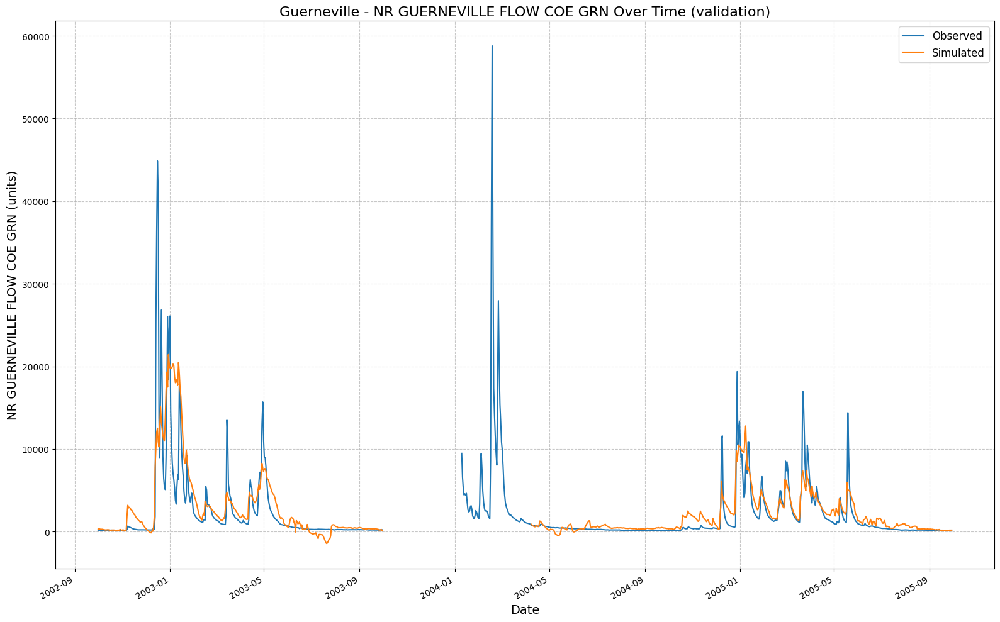

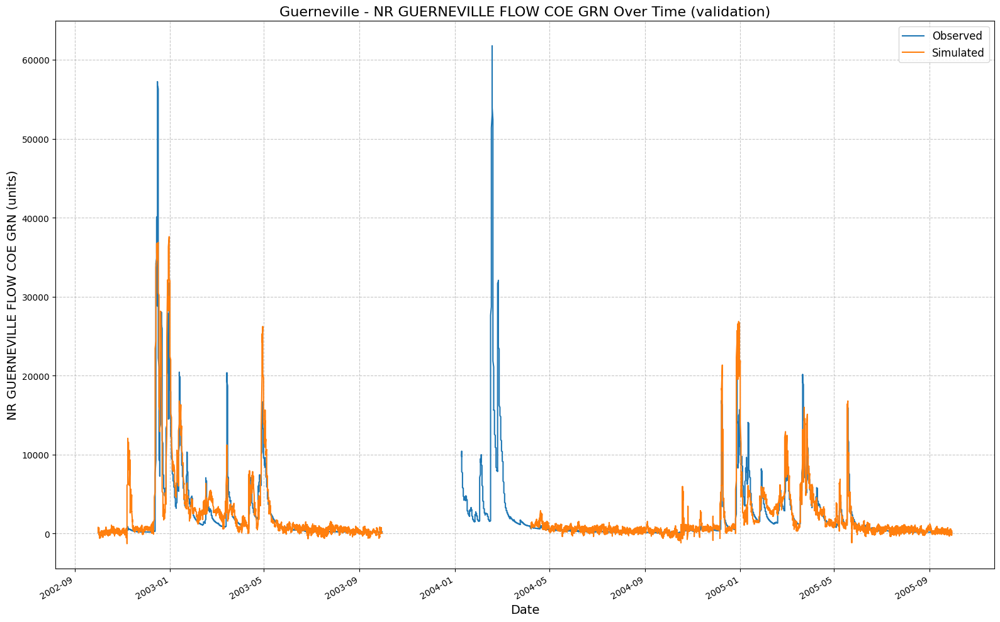

NO-PHYS VAL 1D => NSE = 0.5540512800216675
NO-PHYS VAL 1H => NSE = 0.7761180996894836


In [18]:
if not skip_best_model_validation:
    noPhysValTrainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_no_physics_params,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=True,
        extend_train_period=False,
        gpu=GPU_SETTING,
        is_mts = True,
        # num_ensemble_members = NUM_ENSEMBLES,
        verbose=verbose,
        runs_parent=RUNS_PARENT,
        run_label=RUN_LABEL,
        run_stamp=RUN_STAMP)
    
    noPhysValTrainer.train()
    noPhys_val_csv_1D, noPhys_val_metrics_1D = noPhysValTrainer.results(period="validation", mts_trk="1D")
    noPhys_val_csv_1H, noPhys_val_metrics_1H = noPhysValTrainer.results(period="validation", mts_trk="1H")
    print("NO-PHYS VAL 1D => NSE =", noPhys_val_metrics_1D.get("NSE", None))
    print("NO-PHYS VAL 1H => NSE =", noPhys_val_metrics_1H.get("NSE", None))

[UCB_trainer:_create_config] Injected missing train_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing train_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing validation_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing validation_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing test_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing test_end_date → 01/01/1901
[UCB Trainer] Using CPU (unhandled gpu=-1).
2025-11-24 14:25:01,472: Logging to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142501/output.log initialized.
2025-11-24 14:25:01,472: ### Folder structure created at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142501
2025-11-24 14:25:01,473: ### Run configurations for testing_run
2025-11-24 14:25:01,473: experiment_name: testing_run
2025-11-24 

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 1 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2002-09-30 00:00:00')]
[DEBUG] Using merged date set: 70103 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for train: (70103, 132)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/range_proof_train.txt
100%|██████████| 1/1 [00:04<00:00,  4.33s/it]
2025-11-24 14:25:05,885: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 408.32it/s]
2025-11-24 14:25:05,941: Create lookup table and convert to pytorch tensor
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
2025-11-24 14:25:06,153: No specific hidden size for frequencies are specified. Same hidden size is used for all.
# Epoch 1: 100%|█████

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 2 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2005-09-29 23:00:00'), Timestamp('2005-09-30 00:00:00')]
[DEBUG] Using merged date set: 30168 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for validation: (32615, 132)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/range_proof_validation.txt
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
# Validation: 100%|██████████| 1/1 [00:04<00:00,  4.74s/it]
2025-11-24 14:25:20,593: Stored metrics at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142501/validation/model_epoch002/validation_metrics.csv
2025-11-24 14:25:20,594: Stored results at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guer

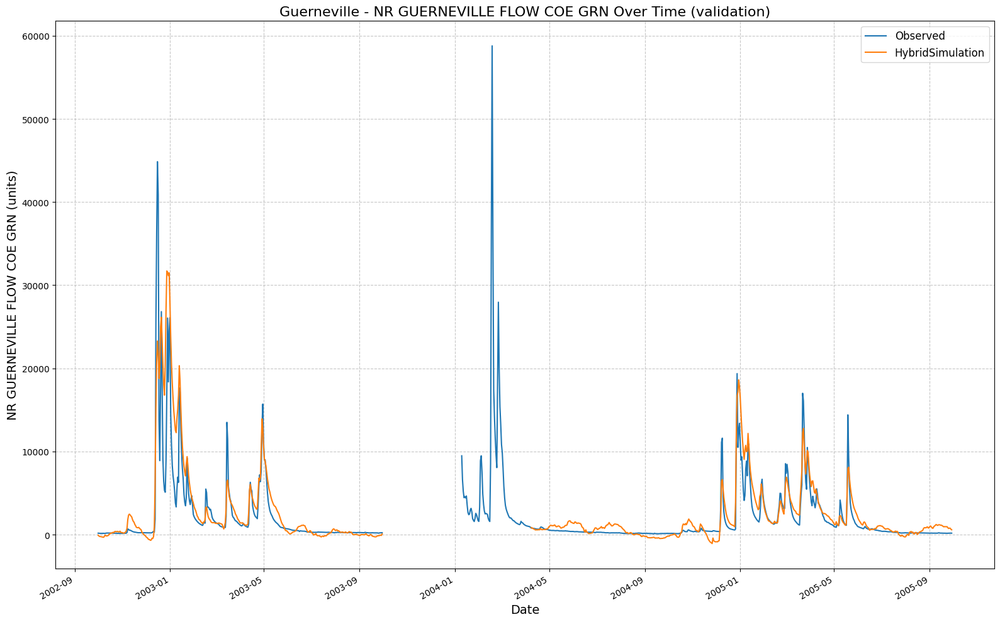

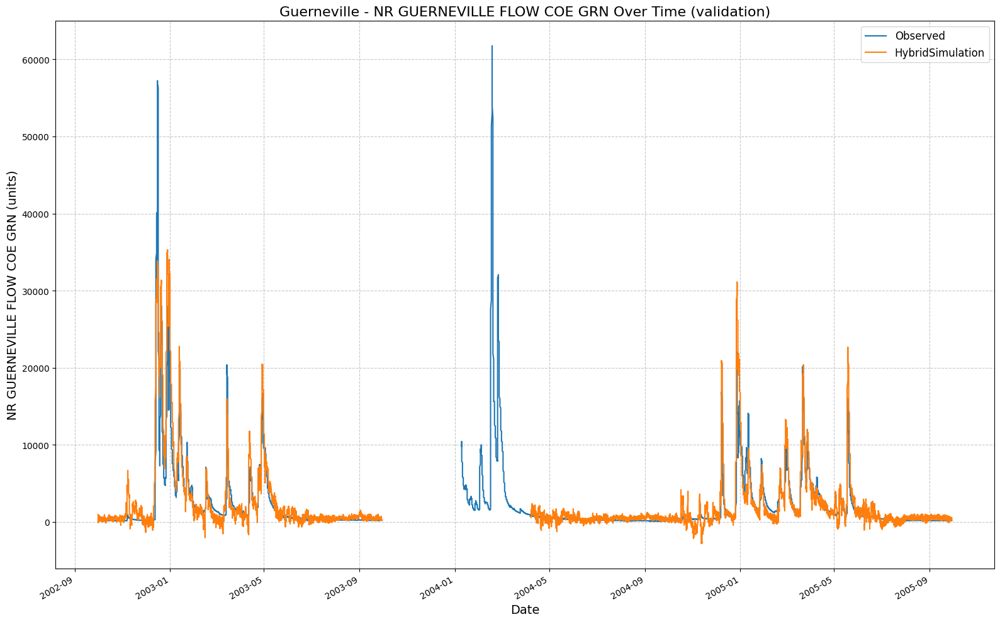

PHYS VAL 1D => NSE = 0.6828110218048096
PHYS VAL 1H => NSE = 0.8099445104598999


In [19]:
if not skip_best_model_validation:
    physValTrainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data_1H,
        hourly=True,
        extend_train_period=False,
        gpu=GPU_SETTING,
        is_mts = True,
        # num_ensemble_members = NUM_ENSEMBLES,
        verbose=verbose,
        runs_parent=RUNS_PARENT,
        run_label=RUN_LABEL,
        run_stamp=RUN_STAMP)
    
    physValTrainer.train()
    phys_val_csv_1D, phys_val_metrics_1D = physValTrainer.results(period="validation", mts_trk="1D")
    phys_val_csv_1H, phys_val_metrics_1H = physValTrainer.results(period="validation", mts_trk="1H")
    print("PHYS VAL 1D => NSE =", phys_val_metrics_1D.get("NSE", None))
    print("PHYS VAL 1H => NSE =", phys_val_metrics_1H.get("NSE", None))

HMS
  NSE = 0.902
  PBIAS = -5.208
LSTM
  NSE = 0.556
  PBIAS = -14.792
PILSTM
  NSE = 0.685
  PBIAS = -21.578


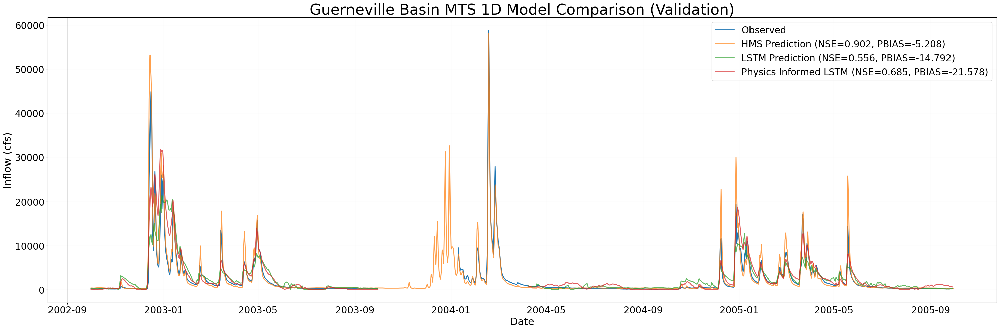

In [20]:
switch_ctx(RES_1D)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1D, phys_val_csv_1D, path_to_physics_data_1D), title="Guerneville Basin MTS 1D Model Comparison (Validation)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_val_metrics_1D.csv", ts_out="guerneville_mts_val_1D_combined_ts.csv", fig_out="guerneville_mts_val_1D_model_comparison.png", legend_font=20, axis_font=22)
else:
    combined_df_val_1D = read_csv_artifact("guerneville_mts_val_1D_combined_ts.csv", kind="csv", period="validation", stamp = READ_STAMP, run_label = RUN_LABEL)
    plot_timeseries_comparison(source=combined_df_val_1D, title="Guerneville Basin MTS 1D Model Comparison (Validation)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_val_metrics_1D.csv", ts_out="guerneville_mts_val_1D_combined_ts.csv", fig_out="guerneville_mts_val_1D_model_comparison.png", legend_font=20, axis_font=22)

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/UCB_training/UCB_plotting.py:55: DtypeWarning: Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.
  hms_raw = pd.read_csv(hms_p)


HMS
  NSE = 0.891
  PBIAS = -5.208
LSTM
  NSE = 0.777
  PBIAS = -14.112
PILSTM
  NSE = 0.813
  PBIAS = -13.183


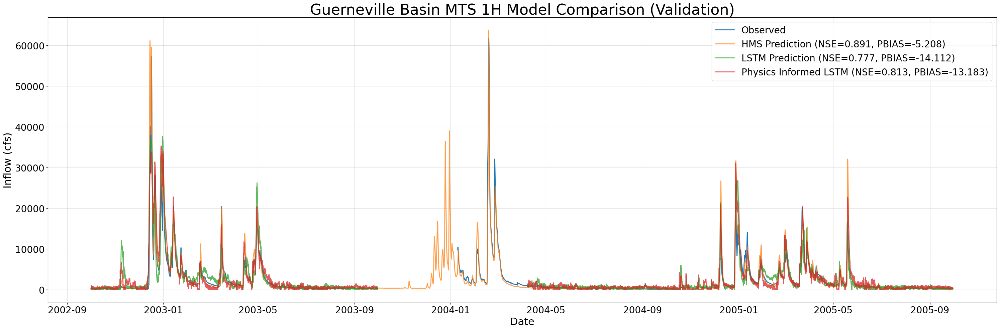

In [21]:
switch_ctx(RES_1H)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1H, phys_val_csv_1H, path_to_physics_data_1H), title="Guerneville Basin MTS 1H Model Comparison (Validation)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_val_metrics_1H.csv", ts_out="guerneville_mts_val_1H_combined_ts.csv", fig_out="guerneville_mts_val_1H_model_comparison.png", legend_font=20, axis_font=22)
else:
    combined_df_val_1H = read_csv_artifact("guerneville_mts_val_1H_combined_ts.csv", kind="csv", period="validation", stamp = READ_STAMP, run_label = RUN_LABEL)
    plot_timeseries_comparison(source=combined_df_val_1H, title="Guerneville Basin MTS 1H Model Comparison (Validation)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_val_metrics_1H.csv", ts_out="guerneville_mts_val_1H_combined_ts.csv", fig_out="guerneville_mts_val_1H_model_comparison.png", legend_font=20, axis_font=22)

In [22]:
switch_ctx(RES_1D)

if skip_best_model_validation:
    val_metrics = read_csv_artifact("guerneville_mts_val_metrics_1D.csv", kind="metrics", period="validation", stamp = READ_STAMP, run_label = RUN_LABEL)
    print(val_metrics)

In [23]:
switch_ctx(RES_1H)

if skip_best_model_validation:
    val_metrics = read_csv_artifact("guerneville_mts_val_metrics_1H.csv", kind="metrics", period="validation", stamp = READ_STAMP, run_label = RUN_LABEL)
    print(val_metrics)

# Test Period


Training No-Physics mts model for test period...
[UCB_trainer:_create_config] Injected missing train_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing train_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing validation_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing validation_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing test_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing test_end_date → 01/01/1901
[UCB Trainer] Using CPU (unhandled gpu=-1).
2025-11-24 14:25:27,821: Logging to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142527/output.log initialized.
2025-11-24 14:25:27,821: ### Folder structure created at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142527
2025-11-24 14:25:27,822: ### Run configurations for testing_run
2025-11-24 14:2

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 1 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2002-09-30 00:00:00')]
[DEBUG] Using merged date set: 70103 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for train: (70103, 53)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/range_proof_train.txt
100%|██████████| 1/1 [00:01<00:00,  1.16s/it]
2025-11-24 14:25:29,023: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 584.16it/s]
2025-11-24 14:25:29,047: Create lookup table and convert to pytorch tensor
100%|██████████| 1/1 [00:00<00:00, 13.61it/s]
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
2025-11-24 14:25:29,138: No specific hidden size for frequencies are specified. 

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 2 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2005-09-29 23:00:00'), Timestamp('2005-09-30 00:00:00')]
[DEBUG] Using merged date set: 30168 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for validation: (32615, 53)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/range_proof_validation.txt
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.73s/it]
2025-11-24 14:25:48,977: Stored metrics at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142527/validation/model_epoch002/validation_metrics.csv
2025-11-24 14:25:48,978: Stored results 

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 2 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2009-09-29 23:00:00'), Timestamp('2009-09-30 00:00:00')]
[DEBUG] Using merged date set: 38928 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for test: (41375, 53)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/range_proof_test.txt
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
# Evaluation: 100%|██████████| 1/1 [00:03<00:00,  3.04s/it]
2025-11-24 14:25:52,030: Stored metrics at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142527/test/model_epoch002/test_metrics.csv
2025-11-24 14:25:52,031: Stored results at /Users/maxwellfung/UC

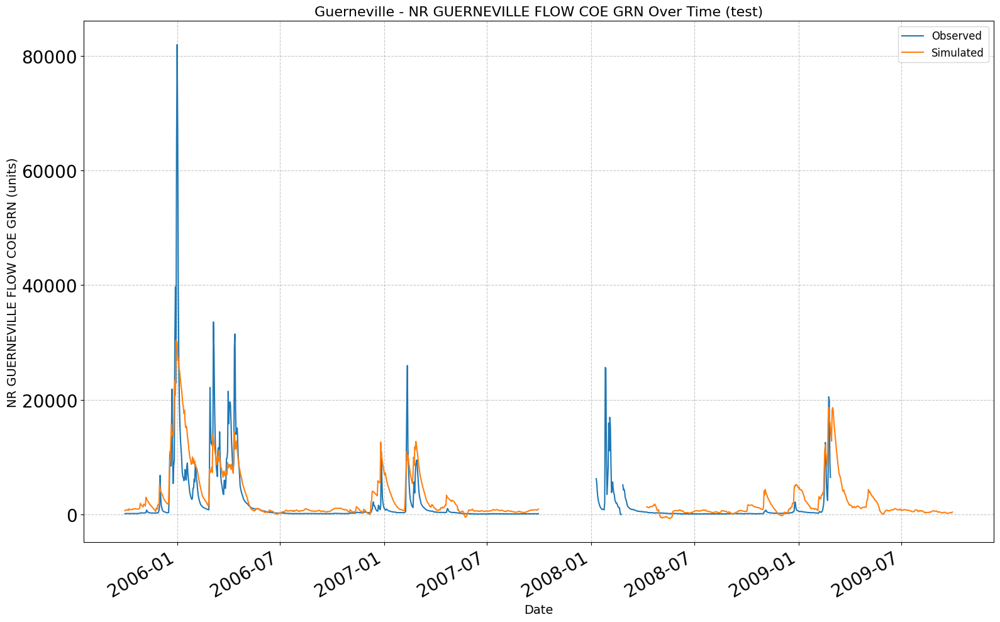

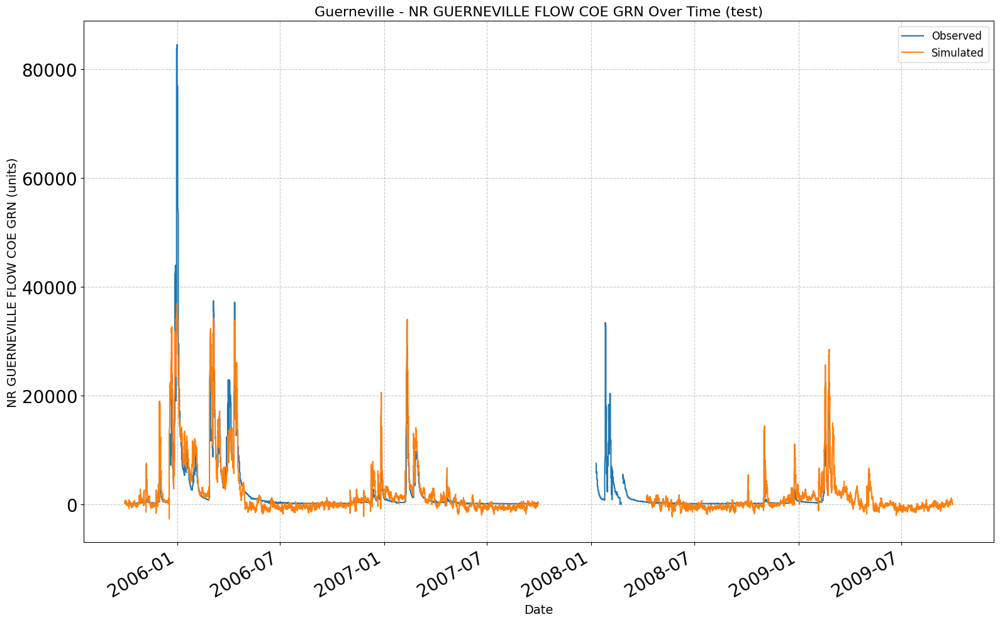


[No-Physics Test] NSE @1D = 0.5998977422714233
[No-Physics Test] NSE @1H = 0.7234022617340088


In [24]:
# if not skip_best_model_test:
print("\nTraining No-Physics mts model for test period...")
mtsNoPhysicsTest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_no_physics_params,
    input_features=None,
    physics_informed=False,
    physics_data_file=None,
    hourly=True,
    extend_train_period=True,
    gpu=GPU_SETTING,
    # num_ensemble_members = NUM_ENSEMBLES,
    is_mts = True,
    verbose=verbose,
    runs_parent=RUNS_PARENT,
    run_label=RUN_LABEL,
    run_stamp=RUN_STAMP)

ensure_absolute_basin_files(mtsNoPhysicsTest, BASIN)

mtsNoPhysicsTest.train()
no_physics_test_csv_1D, no_physics_test_metrics_1D = mtsNoPhysicsTest.results(period="test", mts_trk="1D")
no_physics_test_csv_1H, no_physics_test_metrics_1H = mtsNoPhysicsTest.results(period="test", mts_trk="1H")
print("\n[No-Physics Test] NSE @1D =", no_physics_test_metrics_1D.get("NSE", None))
print("[No-Physics Test] NSE @1H =", no_physics_test_metrics_1H.get("NSE", None))


Training Physics MTS model for test period...
[UCB_trainer:_create_config] Injected missing train_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing train_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing validation_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing validation_end_date → 01/01/1901
[UCB_trainer:_create_config] Injected missing test_start_date → 01/01/1900
[UCB_trainer:_create_config] Injected missing test_end_date → 01/01/1901
[UCB Trainer] Using CPU (unhandled gpu=-1).
2025-11-24 14:25:52,420: Logging to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142552/output.log initialized.
2025-11-24 14:25:52,420: ### Folder structure created at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142552
2025-11-24 14:25:52,421: ### Run configurations for testing_run
2025-11-24 14:25:5

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 1 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2002-09-30 00:00:00')]
[DEBUG] Using merged date set: 70103 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for train: (70103, 132)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/range_proof_train.txt
100%|██████████| 1/1 [00:04<00:00,  4.56s/it]
2025-11-24 14:25:57,068: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 429.22it/s]
2025-11-24 14:25:57,135: Create lookup table and convert to pytorch tensor
100%|██████████| 1/1 [00:00<00:00,  5.36it/s]
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
2025-11-24 14:25:57,366: No specific hidden size for frequencies are specified.

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 2 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2005-09-29 23:00:00'), Timestamp('2005-09-30 00:00:00')]
[DEBUG] Using merged date set: 30168 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for validation: (32615, 132)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/range_proof_validation.txt
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
# Validation: 100%|██████████| 1/1 [00:04<00:00,  4.83s/it]
2025-11-24 14:26:11,690: Stored metrics at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142552/validation/model_epoch002/validation_metrics.csv
2025-11-24 14:26:11,691: Stored results

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/datasetzoo/synthetic_russian_river.py:166: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.Series(pd.date_range(pd.to_datetime(start), pd.to_datetime(end), freq="H"))


[WARN] Trimming 2 hours to make merged dataset length divisible by 24.
[WARN] Trimmed hours (timestamps):
[Timestamp('2009-09-29 23:00:00'), Timestamp('2009-09-30 00:00:00')]
[DEBUG] Using merged date set: 38928 rows kept.
[DEBUG] Enforced uniform frequency: 1H
[DEBUG] Final subset shape for test: (41375, 132)
[PROOF] Wrote dataset verification to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/range_proof_test.txt
[RANGE_LOG] Custom ranges logged to /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_hourly/BASELINE_20251124T222437Z/custom_ranges_log.csv
[RANGE_LOG] Total ranges: 13 across all periods
# Evaluation: 100%|██████████| 1/1 [00:05<00:00,  5.01s/it]
2025-11-24 14:26:16,720: Stored metrics at /Users/maxwellfung/UCB-USACE-RR-PROJECT/outputs/guerneville/mts_shared/runs/BASELINE_20251124T222437Z/testing_run_2411_142552/test/model_epoch002/test_metrics.csv
2025-11-24 14:26:16,721: Stored results at /Users/maxwellfung/U

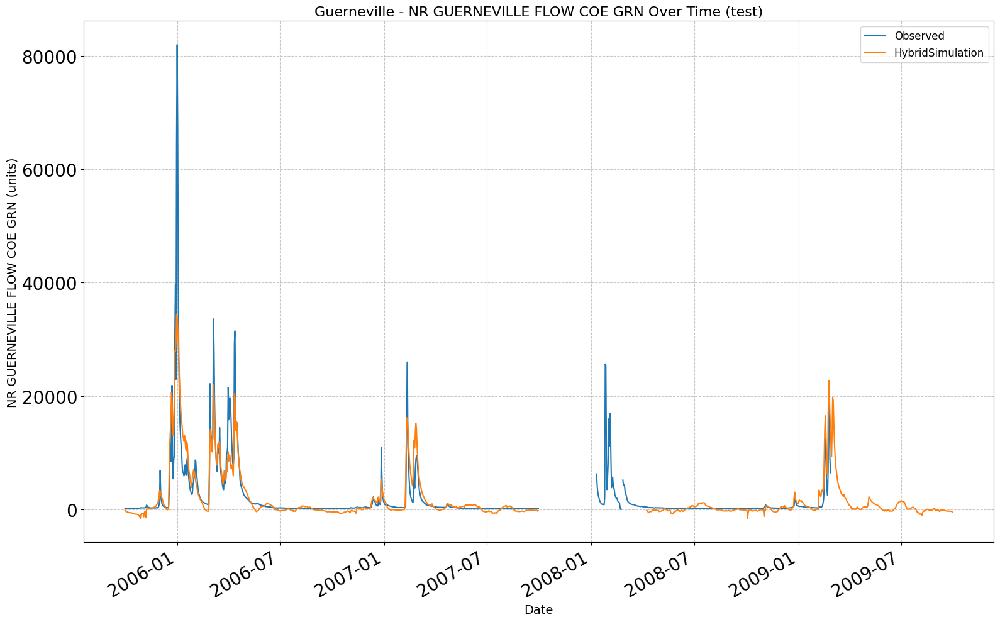

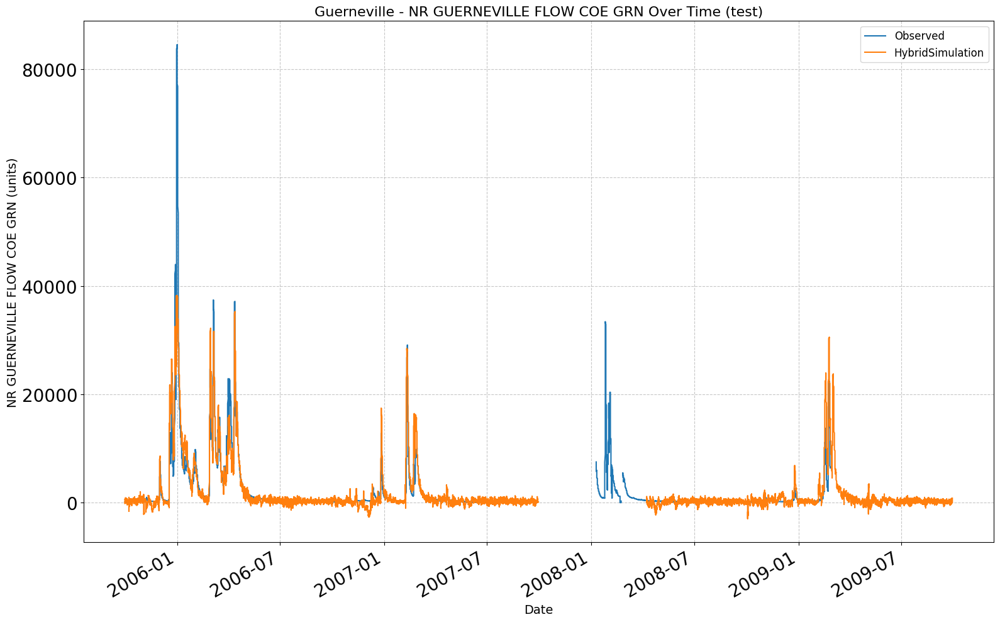


[Physics Test] NSE @1D = 0.7724272012710571
[Physics Test] NSE @1H = 0.7971569299697876


In [25]:
if not skip_best_model_test:
    print("\nTraining Physics MTS model for test period...")
    mtsPhysicsTest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data_1H,
        hourly=True,
        extend_train_period=True,
        gpu=GPU_SETTING,
        # num_ensemble_members = NUM_ENSEMBLES,
        is_mts = True,
        verbose=verbose,
        runs_parent=RUNS_PARENT,
        run_label=RUN_LABEL,
        run_stamp=RUN_STAMP)

    ensure_absolute_basin_files(mtsPhysicsTest, BASIN)

    mtsPhysicsTest.train()
    physics_test_csv_1D, physics_test_metrics_1D = mtsPhysicsTest.results(period="test", mts_trk="1D")
    physics_test_csv_1H, physics_test_metrics_1H = mtsPhysicsTest.results(period="test", mts_trk="1H")
    print("\n[Physics Test] NSE @1D =", physics_test_metrics_1D.get("NSE", None))
    print("[Physics Test] NSE @1H =", physics_test_metrics_1H.get("NSE", None))

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/evaluation/metrics.py:526: RuntimeWarning: invalid value encountered in log
  obs = np.log(obs)


HMS
  NSE = 0.885
  PBIAS = -11.009
LSTM
  NSE = 0.600
  PBIAS = -37.463
PILSTM
  NSE = 0.776
  PBIAS = -1.743


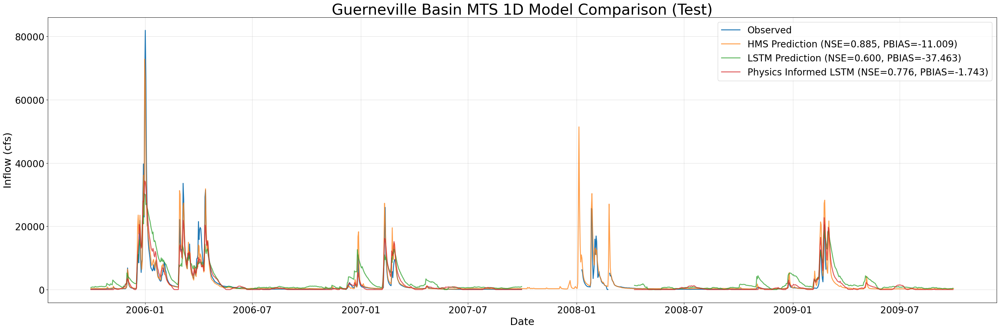

In [26]:
switch_ctx(RES_1D)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Basin MTS 1D Model Comparison (Test)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=20, axis_font=22)
else:
    combined_df_test_1D = read_csv_artifact("guerneville_mts_test_1D_combined_ts.csv", kind="csv", period="test", stamp = READ_STAMP, run_label = RUN_LABEL)
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Basin MTS 1D Model Comparison (Test)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=20, axis_font=22)

In [27]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Basin MTS 1D Model Comparison (Test)", backend="plotly", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Basin MTS 1D Model Comparison (Test)", backend="plotly", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=12, axis_font=22)

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/evaluation/metrics.py:526: RuntimeWarning: invalid value encountered in log
  obs = np.log(obs)


HMS
  NSE = 0.885
  PBIAS = -11.009
LSTM
  NSE = 0.600
  PBIAS = -37.463
PILSTM
  NSE = 0.776
  PBIAS = -1.743


/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/UCB_training/UCB_plotting.py:55: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.



HMS
  NSE = 0.875
  PBIAS = -10.567
LSTM
  NSE = 0.732
  PBIAS = -16.320
PILSTM
  NSE = 0.801
  PBIAS = -8.102


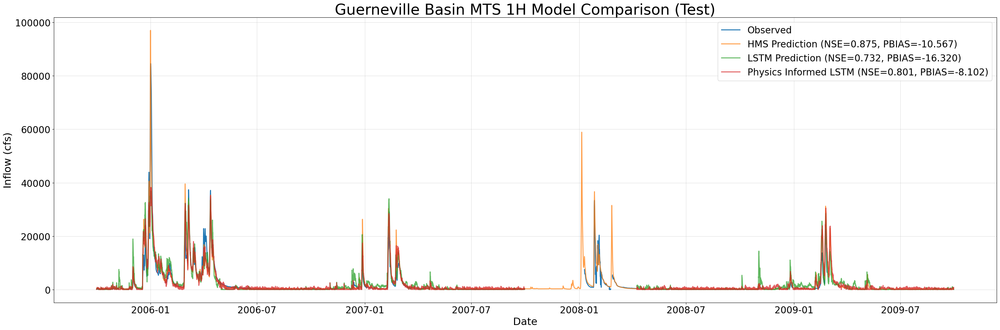

In [28]:
switch_ctx(RES_1H)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Basin MTS 1H Model Comparison (Test)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=20, axis_font=22)
else:
    combined_df_test_1H = read_csv_artifact("guerneville_mts_test_1H_combined_ts.csv", kind="csv", period="test", stamp = READ_STAMP, run_label = RUN_LABEL)
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Basin MTS 1H Model Comparison (Test)", backend="mpl", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=20, axis_font=22)

In [29]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Basin MTS 1H Model Comparison (Test)", backend="plotly", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Basin MTS 1H Model Comparison (Test)", backend="plotly", metrics=["NSE", "PBIAS"], metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=12, axis_font=22)

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/UCB_training/UCB_plotting.py:55: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.



HMS
  NSE = 0.875
  PBIAS = -10.567
LSTM
  NSE = 0.732
  PBIAS = -16.320
PILSTM
  NSE = 0.801
  PBIAS = -8.102


In [30]:
switch_ctx(RES_1D)

test_metrics = read_csv_artifact("guerneville_mts_test_metrics_1D.csv", kind="metrics", period="test", stamp = READ_STAMP, run_label = RUN_LABEL)
print(test_metrics)

     Unnamed: 0           HMS          LSTM        PILSTM
0           NSE  8.848386e-01  6.002465e-01  7.758576e-01
1           MSE  3.758428e+06  1.331707e+07  7.466902e+06
2          RMSE  1.938666e+03  3.649257e+03  2.732563e+03
3           KGE  8.750400e-01  4.637585e-01  7.685148e-01
4     Alpha-NSE  9.862751e-01  7.505409e-01  8.001199e-01
5      Beta-KGE  1.110088e+00  1.425072e+00  1.019781e+00
6      Beta-NSE  3.915179e-02  1.427475e-01  6.642857e-03
7     Pearson-r  9.424906e-01  7.887212e-01  8.849259e-01
8           FHV -3.449083e+00 -2.972568e+01 -2.602241e+01
9           FMS -2.535199e+01 -2.878798e+00  1.017796e+03
10          FLV           NaN -3.650507e+03  1.000000e+02
11  Peak-Timing  8.000000e-01  1.000000e+00  7.500000e-01
12    Peak-MAPE  1.410643e+01  4.926166e+01  3.621049e+01
13        PBIAS -1.100877e+01 -3.746285e+01 -1.743361e+00


In [31]:
switch_ctx(RES_1H)

test_metrics = read_csv_artifact("guerneville_mts_test_metrics_1H.csv", kind="metrics", period="test", stamp = READ_STAMP, run_label = RUN_LABEL)
print(test_metrics)

     Unnamed: 0           HMS          LSTM        PILSTM
0           NSE  8.754040e-01  7.316408e-01  8.005087e-01
1           MSE  4.192673e+06  9.187435e+06  6.829704e+06
2          RMSE  2.047602e+03  3.031078e+03  2.613370e+03
3           KGE  8.771460e-01  7.493237e-01  8.210871e-01
4     Alpha-NSE  9.915687e-01  9.066409e-01  8.877105e-01
5      Beta-KGE  1.105666e+00  1.184953e+00  1.091817e+00
6      Beta-NSE  3.698737e-02  6.125803e-02  3.041061e-02
7     Pearson-r  9.378980e-01  8.588798e-01  8.952600e-01
8           FHV -2.546017e+00 -1.170726e+01 -1.336062e+01
9           FMS -2.384091e+01  1.036680e+03  3.470327e+01
10          FLV  9.759262e+01  1.000000e+02 -7.178957e+02
11  Peak-Timing           NaN           NaN           NaN
12    Peak-MAPE  2.706352e+01  3.375677e+01  2.363903e+01
13        PBIAS -1.056663e+01 -1.632037e+01 -8.102001e+00


In [32]:
if not skip_best_model_test:
    write_paths("no_physics", mtsNoPhysicsTest, filename = RUNS_FILE)
    write_paths("physics", mtsPhysicsTest, filename = RUNS_FILE)
    archived_path = archive_runs_json(Path(RUNS_FILE), BASIN, MODE, RUN_LABEL, RUN_STAMP)

stored experiments for 'no_physics' in guerneville_mts_BASELINE_stored_runs.json: ['testing_run_2411_142527']
stored experiments for 'physics' in guerneville_mts_BASELINE_stored_runs.json: ['testing_run_2411_142552']


In [33]:
end_time = datetime.utcnow()
print("End time:", end_time.strftime("%Y-%m-%d %H:%M:%S"))
print("total time:", end_time - start_time)

End time: 2025-11-24 22:26:26
total time: 0:01:49.881755


##### Additional plots

In [34]:
if skip_best_model_validation:
    switch_ctx(RES_1D)
    combined_df_daily_val = read_csv_artifact("guerneville_mts_val_1D_combined_ts.csv", kind="csv", period="validation", stamp = READ_STAMP, run_label = RUN_LABEL)

    switch_ctx(RES_1H)
    combined_df_hourly_val = read_csv_artifact("guerneville_mts_val_1H_combined_ts.csv", kind="csv", period="validation", stamp = READ_STAMP, run_label = RUN_LABEL)

if skip_best_model_test:
    switch_ctx(RES_1D)
    combined_df_daily = read_csv_artifact("guerneville_mts_test_1D_combined_ts.csv", kind="csv", period="test", stamp = READ_STAMP, run_label = RUN_LABEL)
    switch_ctx(RES_1H)
    combined_df_hourly = read_csv_artifact("guerneville_mts_test_1H_combined_ts.csv", kind="csv", period="test", stamp = READ_STAMP, run_label = RUN_LABEL)

In [35]:
metric_list = ["NSE", "PBIAS"]

wettest_start_val = "2003-10-01"
wettest_end_val = "2004-09-30"
dryest_start_val = "2004-10-01"
dryest_end_val = "2005-09-30"
wettest_start_test = "2005-10-01"
wettest_end_test = "2006-09-30"
dryest_start_test = "2008-10-01"
dryest_end_test = "2009-09-30"

HMS
  NSE = 0.902
  PBIAS = -5.208
LSTM
  NSE = 0.556
  PBIAS = -14.792
PILSTM
  NSE = 0.685
  PBIAS = -21.578


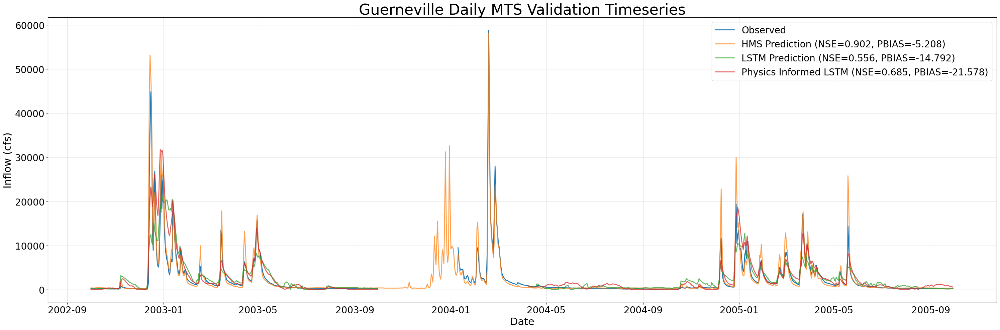

In [36]:
switch_ctx(RES_1D)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1D, phys_val_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Validation Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_val_metrics_1D.csv", ts_out="guerneville_mts_val_1D_combined_ts.csv", fig_out="guerneville_mts_val_1D_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_daily_val, title="Guerneville Daily MTS Validation Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_val_metrics_1D.csv", ts_out="guerneville_mts_val_1D_combined_ts.csv", fig_out="guerneville_mts_val_1D_model_comparison.png", legend_font=20, axis_font=22)

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/UCB_training/UCB_plotting.py:55: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.



HMS
  NSE = 0.891
  PBIAS = -5.208
LSTM
  NSE = 0.777
  PBIAS = -14.112
PILSTM
  NSE = 0.813
  PBIAS = -13.183


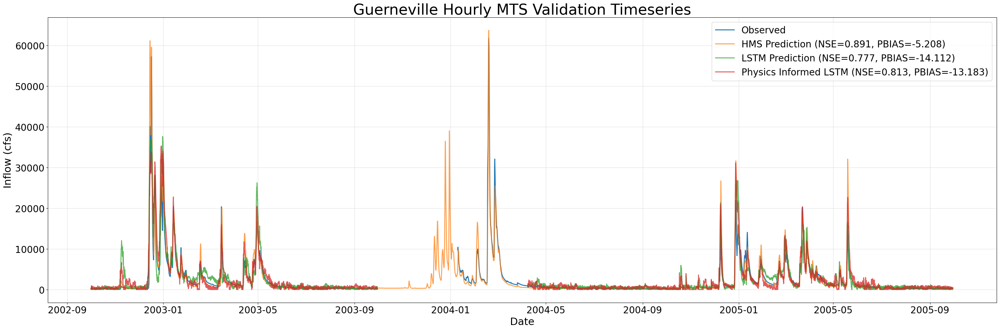

In [37]:
switch_ctx(RES_1H)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1H, phys_val_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Validation Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_val_metrics_1H.csv", ts_out="guerneville_mts_val_1H_combined_ts.csv", fig_out="guerneville_mts_val_1H_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_hourly_val, title="Guerneville Hourly MTS Validation Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_val_metrics_1H.csv", ts_out="guerneville_mts_val_1H_combined_ts.csv", fig_out="guerneville_mts_val_1H_model_comparison.png", legend_font=20, axis_font=22)

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/evaluation/metrics.py:526: RuntimeWarning:

invalid value encountered in log



HMS
  NSE = 0.885
  PBIAS = -11.009
LSTM
  NSE = 0.600
  PBIAS = -37.463
PILSTM
  NSE = 0.776
  PBIAS = -1.743


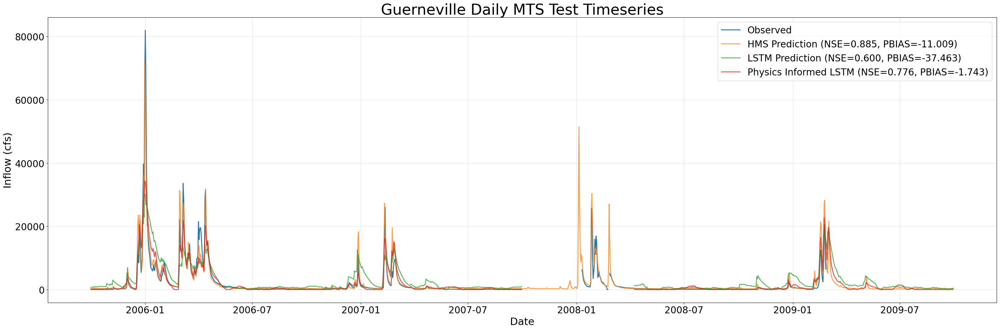

In [38]:
switch_ctx(RES_1D)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Test Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Daily MTS Test Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=20, axis_font=22)

In [39]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Test Timeseries - Interactive", backend="plotly", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Daily MTS Test Timeseries - Interactive", backend="plotly", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1D.csv", ts_out="guerneville_mts_test_1D_combined_ts.csv", fig_out="guerneville_mts_test_1D_model_comparison.png", legend_font=12, axis_font=22)

HMS
  NSE = 0.885
  PBIAS = -11.009
LSTM
  NSE = 0.600
  PBIAS = -37.463
PILSTM
  NSE = 0.776
  PBIAS = -1.743


/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/neuralhydrology/evaluation/metrics.py:526: RuntimeWarning:

invalid value encountered in log



/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/UCB_training/UCB_plotting.py:55: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.



HMS
  NSE = 0.875
  PBIAS = -10.567
LSTM
  NSE = 0.732
  PBIAS = -16.320
PILSTM
  NSE = 0.801
  PBIAS = -8.102


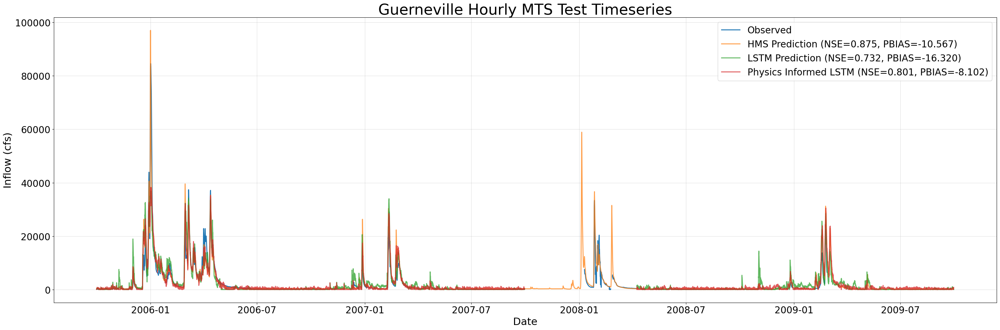

In [40]:
switch_ctx(RES_1H)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Test Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Hourly MTS Test Timeseries", backend="mpl", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=20, axis_font=22)

In [ ]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Test Timeseries - Interactive", backend="plotly", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Hourly MTS Test Timeseries - Interactive", backend="plotly", metrics=metric_list, metrics_out="guerneville_mts_test_metrics_1H.csv", ts_out="guerneville_mts_test_1H_combined_ts.csv", fig_out="guerneville_mts_test_1H_model_comparison.png", legend_font=12, axis_font=22)

/Users/maxwellfung/UCB-USACE-RR-PROJECT/notebooks/basins/guerneville/../../../../UCB-USACE-RR-PROJECT/UCB_training/UCB_plotting.py:55: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.



In [ ]:
# EVERYTHING BELOW HERE MEASURES EXTREME YEARS.

raise SystemExit("EVERYTHING BELOW HERE MEASURES EXTREME YEARS WITH HARDCODED VALUES AND DOESNT MAKE SENSE FOR SYNTHETIC")

##### Wettest Year Performance

In [ ]:
switch_ctx(RES_1D)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1D, phys_val_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Wettest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_val, end_date=wettest_end_val, metrics_out="guerneville_mts_wet_val_metrics_1D.csv", ts_out="guerneville_mts_wet_val_1D_combined_ts.csv", fig_out="guerneville_mts_wet_val_1D_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_daily_val, title="Guerneville Daily MTS Wettest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_val, end_date=wettest_end_val, metrics_out="guerneville_mts_wet_val_metrics_1D.csv", ts_out="guerneville_mts_wet_val_1D_combined_ts.csv", fig_out="guerneville_mts_wet_val_1D_model_comparison.png", legend_font=20, axis_font=22)

In [ ]:
switch_ctx(RES_1H)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1H, phys_val_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Wettest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_val, end_date=wettest_end_val, metrics_out="guerneville_mts_wet_val_metrics_1H.csv", ts_out="guerneville_mts_wet_val_1H_combined_ts.csv", fig_out="guerneville_mts_wet_val_1H_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_hourly_val, title="Guerneville Hourly MTS Wettest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_val, end_date=wettest_end_val, metrics_out="guerneville_mts_wet_val_metrics_1H.csv", ts_out="guerneville_mts_wet_val_1H_combined_ts.csv", fig_out="guerneville_mts_wet_val_1H_model_comparison.png", legend_font=20, axis_font=22)

In [ ]:
switch_ctx(RES_1D)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Wettest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1D.csv", ts_out="guerneville_mts_wet_test_1D_combined_ts.csv", fig_out="guerneville_mts_wet_test_1D_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Daily MTS Wettest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1D.csv", ts_out="guerneville_mts_wet_test_1D_combined_ts.csv", fig_out="guerneville_mts_wet_test_1D_model_comparison.png", legend_font=20, axis_font=22)

In [ ]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Wettest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1D.csv", ts_out="guerneville_mts_wet_test_1D_combined_ts.csv", fig_out="guerneville_mts_wet_test_1D_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Daily MTS Wettest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1D.csv", ts_out="guerneville_mts_wet_test_1D_combined_ts.csv", fig_out="guerneville_mts_wet_test_1D_model_comparison.png", legend_font=12, axis_font=22)

In [ ]:
switch_ctx(RES_1H)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Wettest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1H.csv", ts_out="guerneville_mts_wet_test_1H_combined_ts.csv", fig_out="guerneville_mts_wet_test_1H_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Hourly MTS Wettest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1H.csv", ts_out="guerneville_mts_wet_test_1H_combined_ts.csv", fig_out="guerneville_mts_wet_test_1H_model_comparison.png", legend_font=12, axis_font=22)

In [ ]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Wettest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1H.csv", ts_out="guerneville_mts_wet_test_1H_combined_ts.csv", fig_out="guerneville_mts_wet_test_1H_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Hourly MTS Wettest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=wettest_start_test, end_date=wettest_end_test, metrics_out="guerneville_mts_wet_test_metrics_1H.csv", ts_out="guerneville_mts_wet_test_1H_combined_ts.csv", fig_out="guerneville_mts_wet_test_1H_model_comparison.png", legend_font=12, axis_font=22)

##### Dryest Year Performance

In [ ]:
switch_ctx(RES_1D)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1D, phys_val_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Dryest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_val, end_date=dryest_end_val, metrics_out="guerneville_mts_dry_val_metrics_1D.csv", ts_out="guerneville_mts_dry_val_1D_combined_ts.csv", fig_out="guerneville_mts_dry_val_1D_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_daily_val, title="Guerneville Daily MTS Dryest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_val, end_date=dryest_end_val, metrics_out="guerneville_mts_dry_val_metrics_1D.csv", ts_out="guerneville_mts_dry_val_1D_combined_ts.csv", fig_out="guerneville_mts_dry_val_1D_model_comparison.png", legend_font=20, axis_font=22)

In [ ]:
switch_ctx(RES_1H)

if not skip_best_model_validation:
    plot_timeseries_comparison(source=(noPhys_val_csv_1H, phys_val_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Dryest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_val, end_date=dryest_end_val, metrics_out="guerneville_mts_dry_val_metrics_1H.csv", ts_out="guerneville_mts_dry_val_1H_combined_ts.csv", fig_out="guerneville_mts_dry_val_1H_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_hourly_val, title="Guerneville Hourly MTS Dryest Year Validation Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_val, end_date=dryest_end_val, metrics_out="guerneville_mts_dry_val_metrics_1H.csv", ts_out="guerneville_mts_dry_val_1H_combined_ts.csv", fig_out="guerneville_mts_dry_val_1H_model_comparison.png", legend_font=20, axis_font=22)

In [ ]:
switch_ctx(RES_1D)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Dryest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1D.csv", ts_out="guerneville_mts_dry_test_ts_1D.csv", fig_out="guerneville_mts_dry_test_plot_1D.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Daily MTS Dryest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1D.csv", ts_out="guerneville_mts_dry_test_ts_1D.csv", fig_out="guerneville_mts_dry_test_plot_1D.png", legend_font=20, axis_font=22)

In [ ]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), title="Guerneville Daily MTS Dryest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1D.csv", ts_out="guerneville_mts_dry_test_1D_combined_ts.csv", fig_out="guerneville_mts_dry_test_1D_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1D, title="Guerneville Daily MTS Dryest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1D.csv", ts_out="guerneville_mts_dry_test_1D_combined_ts.csv", fig_out="guerneville_mts_dry_test_1D_model_comparison.png", legend_font=12, axis_font=22)

In [ ]:
switch_ctx(RES_1H)

if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Dryest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1H.csv", ts_out="guerneville_mts_dry_test_1H_combined_ts.csv", fig_out="guerneville_mts_dry_test_1H_model_comparison.png", legend_font=20, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Hourly MTS Dryest Year Test Timeseries", backend="mpl", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1H.csv", ts_out="guerneville_mts_dry_test_1H_combined_ts.csv", fig_out="guerneville_mts_dry_test_1H_model_comparison.png", legend_font=20, axis_font=22)

In [ ]:
if not skip_best_model_test:
    plot_timeseries_comparison(source=(no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), title="Guerneville Hourly MTS Dryest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1H.csv", ts_out="guerneville_mts_dry_test_1H_combined_ts.csv", fig_out="guerneville_mts_dry_test_1H_model_comparison.png", legend_font=12, axis_font=22)
else:
    plot_timeseries_comparison(source=combined_df_test_1H, title="Guerneville Hourly MTS Dryest Year Test Timeseries - Interactive", backend="plotly", metrics=metric_list, start_date=dryest_start_test, end_date=dryest_end_test, metrics_out="guerneville_mts_dry_test_metrics_1H.csv", ts_out="guerneville_mts_dry_test_1H_combined_ts.csv", fig_out="guerneville_mts_dry_test_1H_model_comparison.png", legend_font=12, axis_font=22)

##### Gridded Timeseries Plots - Validation & Test

In [ ]:
switch_ctx(RES_1D)

if not skip_best_model_validation:
    ts_triptych_v3((noPhys_val_csv_1D, phys_val_csv_1D, path_to_physics_data_1D),wet_start=wettest_start_val, wet_end=wettest_end_val, dry_start=dryest_start_val, dry_end=dryest_end_val, save_path="guerneville_mts_daily_TS_validation.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d-%b-%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title="Guerneville MTS Daily Validation Period Timeseries Across Models", main_title_font=14, main_title_y=0.99, main_title_pad=0.05, row_titles=("Full Validation period","Most-wet water-year","Most-dry water-year"))

else:
    ts_triptych_v3(combined_df_daily_val, wet_start=wettest_start_val, wet_end=wettest_end_val, dry_start=dryest_start_val,dry_end=dryest_end_val, save_path="guerneville_mts_daily_TS_validation.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d‑%b‑%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title = "Guerneville MTS Daily Validation Timeseries Across Models", main_title_font=14, main_title_y = 0.99, main_title_pad = 0.05, row_titles=("Full Validation Period", "Most‑wet water‑year", "Most‑dry water‑year"))

In [ ]:
switch_ctx(RES_1H)

if not skip_best_model_validation:
    ts_triptych_v3((noPhys_val_csv_1H, phys_val_csv_1H, path_to_physics_data_1H), wet_start=wettest_start_val, wet_end=wettest_end_val, dry_start=dryest_start_val, dry_end=dryest_end_val, save_path="guerneville_mts_hourly_TS_validation.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d-%b-%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title="Guerneville MTS Hourly Validation Period Timeseries Across Models", main_title_font=14, main_title_y=0.99, main_title_pad=0.05, row_titles=("Full Validation period","Most-wet water-year","Most-dry water-year"))
    
else:
    ts_triptych_v3(combined_df_hourly_val, wet_start=wettest_start_val, wet_end=wettest_end_val, dry_start=dryest_start_val, dry_end=dryest_end_val, save_path="guerneville_mts_hourly_TS_validation.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d‑%b‑%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title = "Guerneville MTS Hourly Validation Timeseries Across Models", main_title_font=14, main_title_y = 0.99, main_title_pad = 0.05, row_titles=("Full Validation Period", "Most‑wet water‑year", "Most‑dry water‑year"))

In [ ]:
switch_ctx(RES_1D)

if not skip_best_model_test:
    ts_triptych_v3((no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), wet_start=wettest_start_test, wet_end=wettest_end_test, dry_start=dryest_start_test, dry_end=dryest_end_test, save_path="guerneville_mts_daily_TS_test.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d-%b-%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title="Guerneville MTS Daily Test Period Timeseries Across Models", main_title_font=14, main_title_y=0.99, main_title_pad=0.05, row_titles=("Full Test period","Most-wet water-year","Most-dry water-year"))
    
else:
    ts_triptych_v3(combined_df_daily, wet_start=wettest_start_test, wet_end=wettest_end_test, dry_start=dryest_start_test, dry_end=dryest_end_test, save_path="guerneville_mts_daily_TS_test.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d‑%b‑%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title = "Guerneville MTS Daily Test Timeseries Across Models", main_title_font=14, main_title_y = 0.99, main_title_pad = 0.05, row_titles=("Full Test Period", "Most‑wet water‑year", "Most‑dry water‑year"))

In [ ]:
switch_ctx(RES_1H)

if not skip_best_model_test:
    ts_triptych_v3((no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), wet_start=wettest_start_test, wet_end=wettest_end_test, dry_start=dryest_start_test, dry_end=dryest_end_test, save_path="guerneville_mts_hourly_TS_test.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d-%b-%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title="Guerneville MTS Hourly Test Period Timeseries Across Models", main_title_font=14, main_title_y=0.99, main_title_pad=0.05, row_titles=("Full Test period","Most-wet water-year","Most-dry water-year"))
    
else:
    ts_triptych_v3(combined_df_hourly, wet_start=wettest_start_test, wet_end=wettest_end_test, dry_start=dryest_start_test, dry_end=dryest_end_test, save_path="guerneville_mts_hourly_TS_test.png", legend_font=12, legend_boxpad=0.5, axis_font=12, date_fmt="%d‑%b‑%Y", figsize=(10, 10), dpi=600, hspace=0.2, main_title = "Guerneville MTS Hourly Test Timeseries Across Models", main_title_font=14, main_title_y = 0.99, main_title_pad = 0.05, row_titles=("Full Test Period", "Most‑wet water‑year","Most‑dry water‑year"))

##### Gridded Scatter Plots - Test

In [ ]:
switch_ctx(RES_1D)

if not skip_best_model_test:
    scatter_triptych_pngs_v3((no_physics_test_csv_1D, physics_test_csv_1D, path_to_physics_data_1D), wet_start = wettest_start_test, wet_end = wettest_end_test, dry_start = dryest_start_test, dry_end = dryest_end_test, out_dir = "guerneville_mts_daily_scatter", layout = "horizontal", square_side = 4.5, legend_font  = 16, axis_font = 16, point_size = 28, top_pad = .90, suptitle_y = 1.04, dpi = 600, row_titles = ("Guerneville MTS Daily – Full test period", "Guerneville MTS Daily – Wettest water‑year", "Guerneville MTS Daily – Driest water‑year"), resolution="mts_daily")
    
else:
    scatter_pngs = scatter_triptych_pngs_v3(combined_df_daily, wet_start = wettest_start_test, wet_end = wettest_end_test, dry_start = dryest_start_test, dry_end = dryest_end_test, out_dir = "guerneville_mts_daily_scatter", layout = "horizontal", square_side = 4.5,legend_font  = 16, axis_font = 16, point_size = 28, top_pad = .90, suptitle_y = 1.04, dpi = 600, row_titles = ("Guerneville MTS Daily – Full test period", "Guerneville MTS Daily – Wettest water‑year", "Guerneville MTS Daily – Driest water‑year"), resolution="mts_daily")

In [ ]:
switch_ctx(RES_1H)

if not skip_best_model_test:
    scatter_triptych_pngs_v3((no_physics_test_csv_1H, physics_test_csv_1H, path_to_physics_data_1H), wet_start = wettest_start_test, wet_end = wettest_end_test, dry_start = dryest_start_test, dry_end = dryest_end_test, out_dir = "guerneville_mts_hourly_scatter", layout = "horizontal", square_side = 4.5, legend_font = 16, axis_font = 16, point_size = 28, top_pad = .90, suptitle_y = 1.04, dpi = 600, row_titles = ("Guerneville MTS Hourly – Full test period", "Guerneville MTS Hourly – Wettest water‑year", "Guerneville MTS Hourly – Driest water‑year"), resolution="mts_hourly")
    
else:
    scatter_pngs = scatter_triptych_pngs_v3(combined_df_hourly, wet_start = wettest_start_test, wet_end = wettest_end_test, dry_start = dryest_start_test,  dry_end = dryest_end_test, out_dir = "guerneville_mts_hourly_scatter", layout = "horizontal", square_side = 4.5, legend_font = 16, axis_font = 16, point_size = 28, top_pad = .90, suptitle_y = 1.04, dpi = 600, row_titles = ("Guerneville MTS Hourly – Full test period", "Guerneville MTS Hourly – Wettest water‑year", "Guerneville MTS Hourly – Driest water‑year"),resolution="mts_hourly")